In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import celltypist
import seaborn as sns
from rich import print
#from scib_metrics.benchmark import Benchmarker

/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:388: SyntaxWarning: invalid escape sequence '\m'
  """ Implements modularity. This quality function is well-defined only for positive edge weights.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:761: SyntaxWarning: invalid escape sequence '\m'
  """ Implements Reichardt and Bornholdt's Potts model with a configuration null model.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/Optimiser.py:7: SyntaxWarning: invalid escape sequence '\g'
  """ Class for doing community detection using the Leiden algorithm.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/Optimiser.py:305: SyntaxWarning: invalid escape sequence '\s'
  """ Optimise the given partitions simultaneously.


In [53]:
adata = sc.read('TSB_annotated_log1p_scvi_full.h5ad')

/tmp/ipykernel_8846/445882936.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


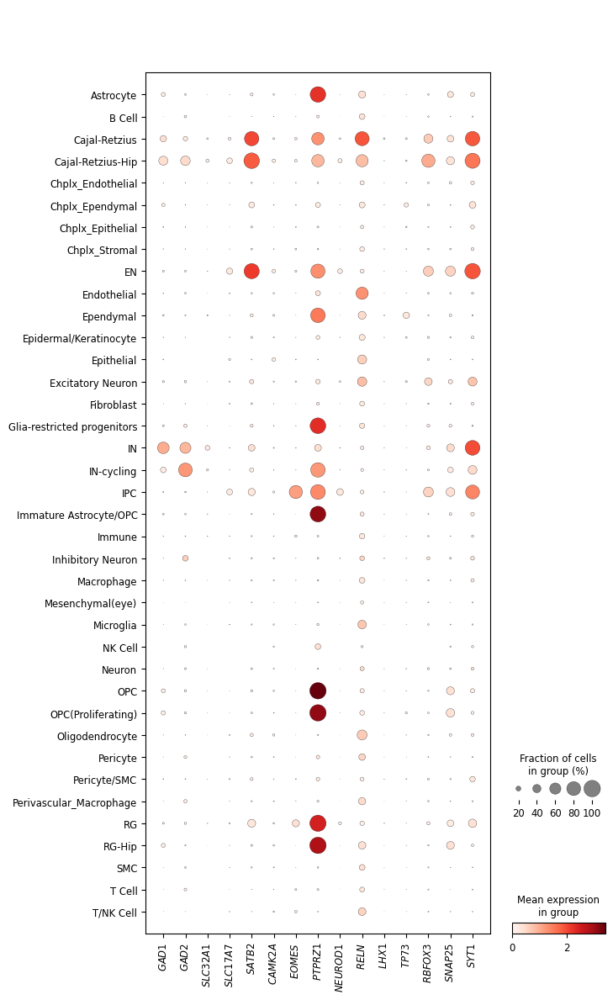

In [54]:
marker_genes = [
    #'PDGFRA', 'CSPG4', 'OLIG1',                # OPC
    'GAD1', 'GAD2', 'SLC32A1',                 # IN (Inhibitory Neuron)
    #'SOX9', 'AQP4', 'OLIG2',                   # Immature Astrocyte/OPC
    #'GFAP', 'AQP4', 'SLC1A3',                  # Astrocyte
    #'CX3CR1', 'P2RY12', 'TMEM119',             # Microglia
    #'CD68', 'CD163', 'CD14',                   # Macrophage
    #'MKI67', 'TOP2A', 'PCNA',                  # IN-cycling
    #'PTPRC', 'ITGAM', 'CD3D',                  # Immune
    #'PECAM1', 'VWF', 'CLDN5',                  # Endothelial
    #'HES1', 'VIM', 'PAX6',                     # RG
    'SLC17A7', 'SATB2', 'CAMK2A',              # EN
    #'PDGFRB', 'ACTA2', 'RGS5',                 # Pericyte/SMC
    #'DCN', 'COL1A1', 'LUM',                    # Chplx_Stromal
    #'FOXJ1', 'S100B', 'CD24',                  # Chplx_Ependymal, Ependymal
    'EOMES', 'PTPRZ1', 'NEUROD1',              # IPC
    'RELN', 'LHX1', 'TP73',                   # Cajal-Retzius, Cajal-Retzius-Hip
    #'EPCAM', 'KRT8', 'KRT18',                  # Chplx_Epithelial, Epithelial
    #'KRT14', 'KRT5', 'KRT1',                   # Epidermal/Keratinocyte
    #'COL1A2', 'FBLN1',                         # Fibroblast
    #'PITX2', 'FOXC1',                          # Mesenchymal(eye)
    #'LYVE1', 'MRC1', 'F13A1',                  # Perivascular_Macrophage
    #'SOX9', 'NFIA',                            # Glia-restricted progenitors
    #'PDGFRB', 'RGS5', 'KCNJ8',                 # Pericyte
    #'MS4A1', 'CD79A', 'CD19',                  # B Cell
    #'ACTA2', 'MYH11', 'TAGLN',                 # SMC
    #'CD3D', 'CD3E', 'CD2',                     # T Cell, T/NK Cell
    #'MBP', 'MOG', 'PLP1',                      # Oligodendrocyte
    #'NCAM1', 'NKG7', 'GNLY',                   # NK Cell
    'RBFOX3', 'SNAP25', 'SYT1'                 # Neuron
]


dp = sc.pl.dotplot(adata, marker_genes, 'cell_type_lvl1', show=False)
ax = dp.get('mainplot_ax', plt.gca())

# Make all gene names italic using mathtext
genes_italic = [r"$\mathit{{{}}}$".format(g) for g in marker_genes]
ax.set_xticklabels(genes_italic, rotation=90)

plt.tight_layout()
plt.show()

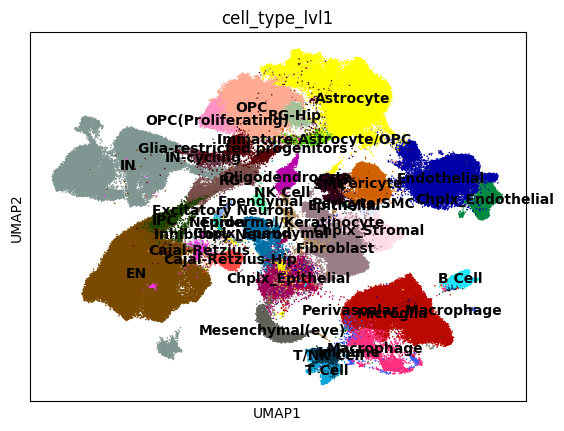

In [55]:
sc.pl.umap(adata, color=["cell_type_lvl1"], size=5,legend_loc="on data")

## Annotate Cell Class

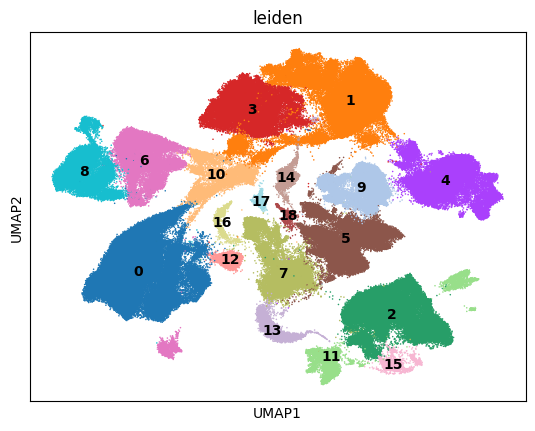

In [56]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata, resolution=0.2)
sc.pl.umap(adata, color=["leiden"], size=5,legend_loc="on data")

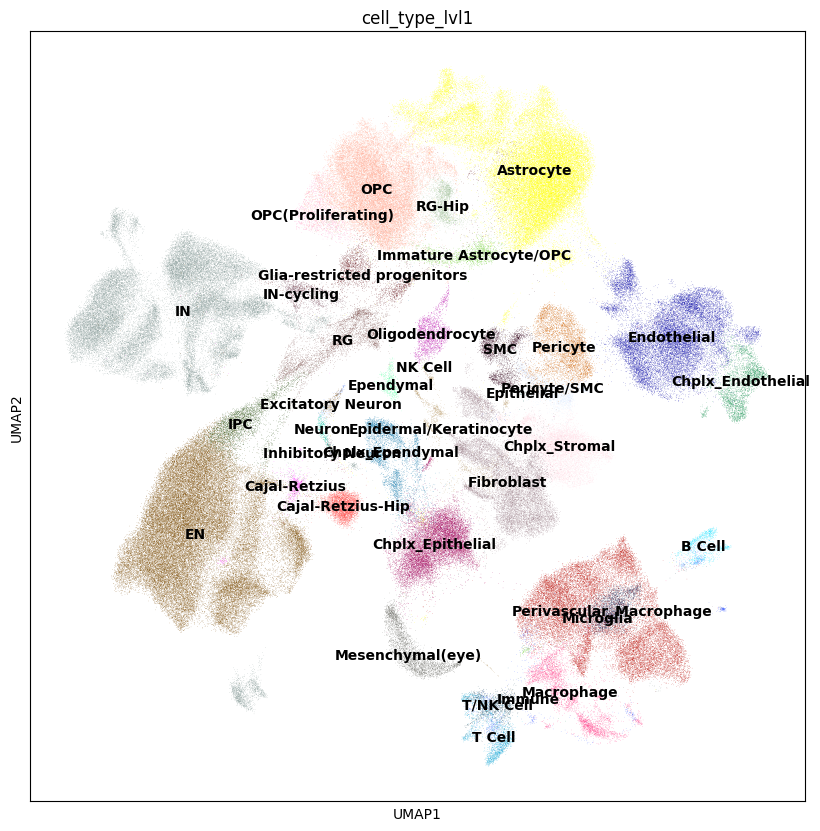

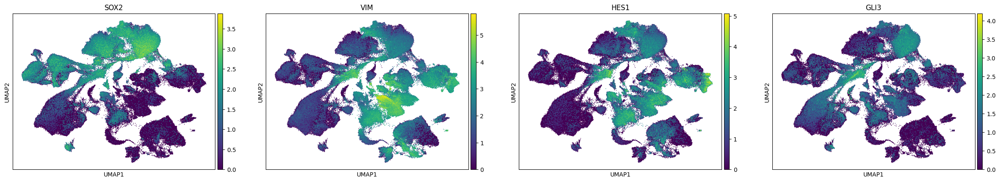

In [57]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(adata, color="cell_type_lvl1", legend_loc="on data")
    
sc.pl.umap(adata, color=["SOX2", 'VIM', 'HES1', 'GLI3'], size=5)

In [58]:
adata.obs["cell_class"] = adata.obs["leiden"].map(
    {
        "0": "Neuronal",
        "1": "Glial",
        "2": "Immune",
        "3": "Glial",
        "4": "Vascular",
        "5": "Mesenchymal",
        "6": "Neuronal",
        "7": "Epithelial",
        "8": "Neuronal",
        "9": "Vascular",
        "10": "Neuronal",
        "11": "Immune",
        "12": "Neuronal",
        "13": "Epithelial",
        "14": "Glial",
        "15": "Immune",
        "16": "Neuronal",
        "17": "Glial",
        "18": "Epithelial",
    }
)



cell_class_colors = [
    "#1f77b4",  # Epithelial
    "#2ca02c",  # Glial
    "#d62728",  # Immune
    "#9467bd",  # Mesenchymal
    "#8c564b",  # Neuronal
    "#e377c2",  # Vascular
    "#7f7f7f"   # Unk
]

adata.uns["cell_class_colors"] = cell_class_colors


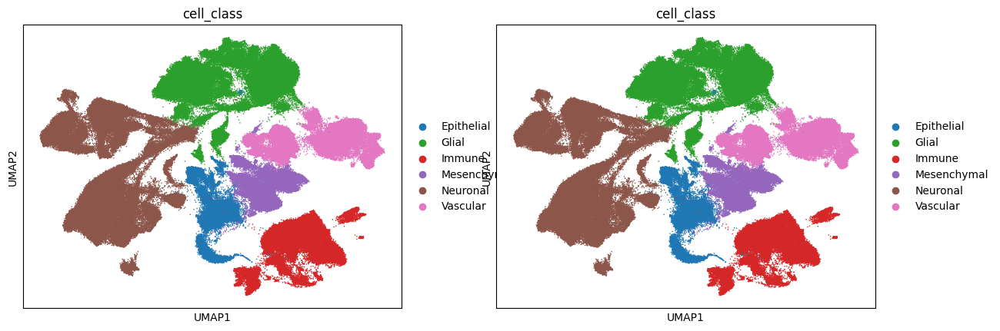

In [59]:
sc.pl.umap(adata, color=["cell_class", "cell_class"], size=5)

## Reannotate Cell Type

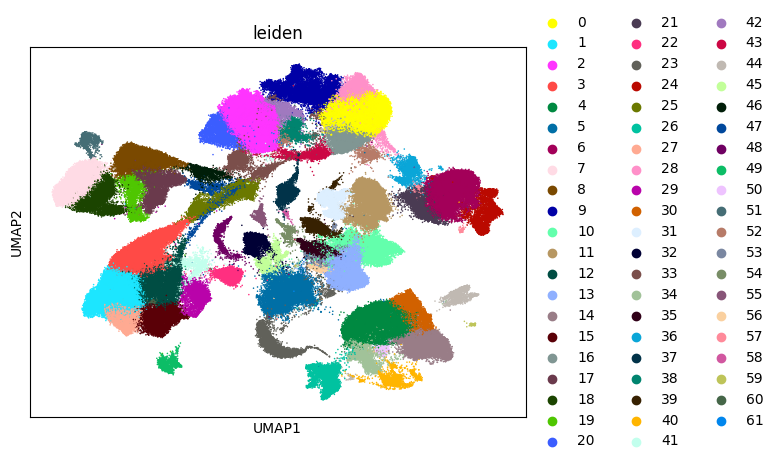

In [60]:
sc.tl.leiden(adata, resolution=2)
sc.pl.umap(adata, color=["leiden"], size=5)

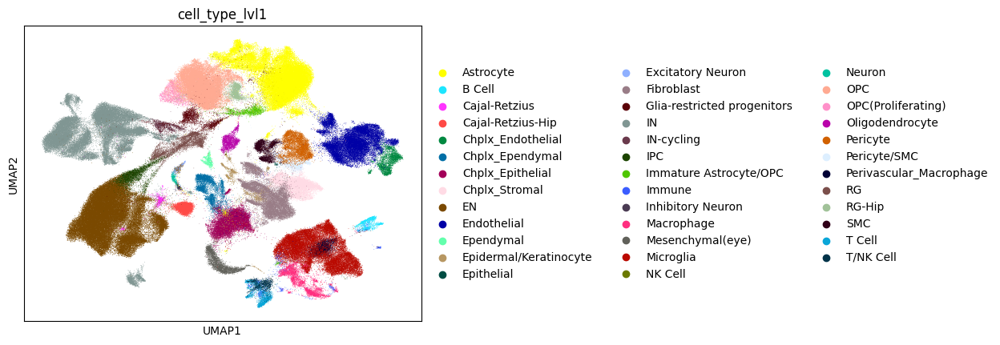

In [61]:
sc.pl.umap(adata, color=["cell_type_lvl1"], size=1,ncols=1
 #save="test.pdf"
 )

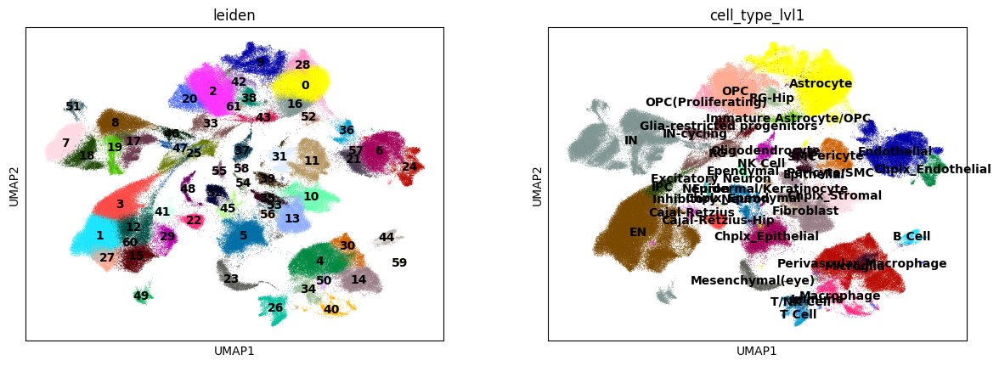

In [62]:
sc.pl.umap(adata, color=["leiden", "cell_type_lvl1"], size=1,ncols=2,legend_loc="on data")

In [67]:
import scanpy as sc

# Organized marker list in the order matching the paper’s UMAP panel and abbreviations
marker_genes = [
    # RG
    "HES1", "TFAP2C", "CRYAB", "FBXO32", "TNC", "HOPX",
    # EN
    "SLC17A6", "EOMES", "NRP1", "GLIS3",
    # EN-UL (upper layer)
    "CUX2", "RORB",
    # EN-DL (deep layer)
    "IL1RAPL2", "ZNF804B", "FEZF2", "NWD2", "TSHZ2", "SYT6", "FHIP1A",
    # IN (pan and subtypes)
    "GAD1", "MEIS2", "ADARB2", "VIP", "CCK", "LAMP5", "NXPH1", "SST", "PVALB", "FOXP1", "FOXP2", "SNCG",
    # Astro
    "AQP4", "GFAP", "EGFR", "GRM3", "MAP3K1", "MOXD1",
    # Oligo
    "OLIG1", "SOX10", "MBP", "BCAS1",
    # Micro
    "IRF8", "IGFBP7",
    # CR
    "RELN",
    #
    "FOXJ1"
]


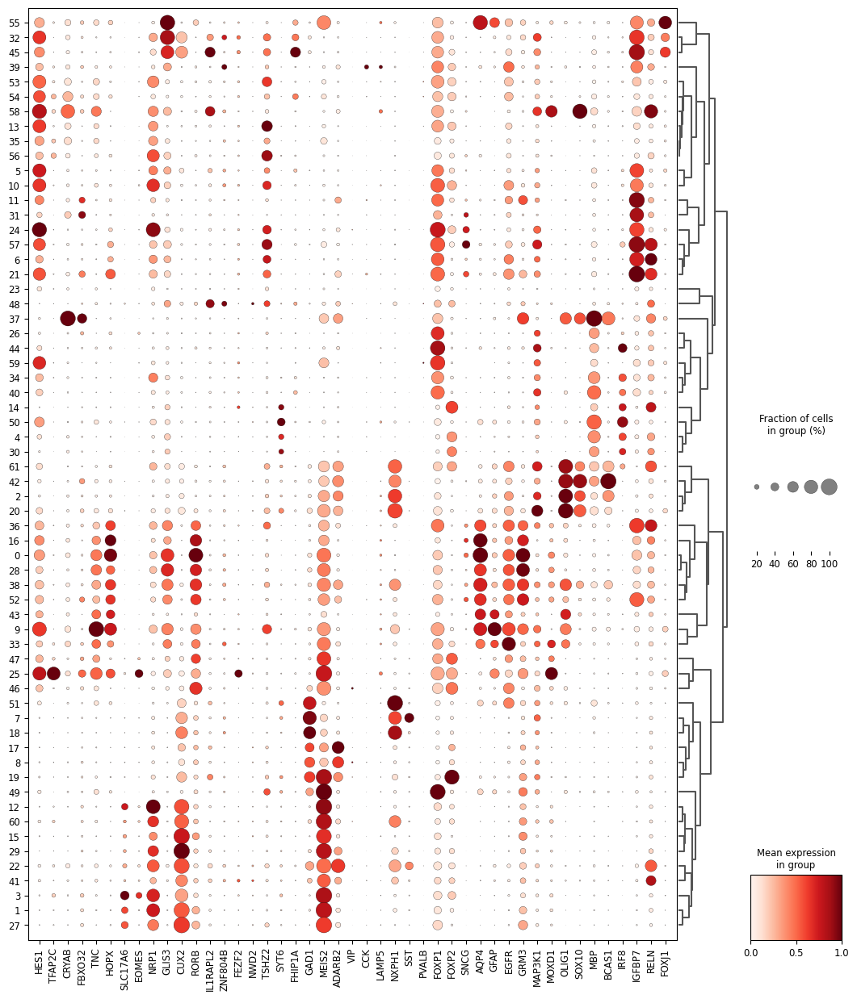

In [68]:
sc.pl.dotplot(
    adata,
    var_names=marker_genes,
    groupby="leiden",  # or whatever your cluster column is
    standard_scale="var",
    dendrogram=True,
    show=True,
    figsize=(13, 15)
)

In [65]:
#sc.pl.dotplot(
#    adata,
#    var_names=["HOPX", "TNC", "MOXD1", "FAM107A", "VIM", "SOX2", "PAX6", "CRYAB", "FBXO32", "HES1", "ID3"],
#    groupby="leiden",
#    dendrogram=True,
#    standard_scale="var",
#    show=True,
#)

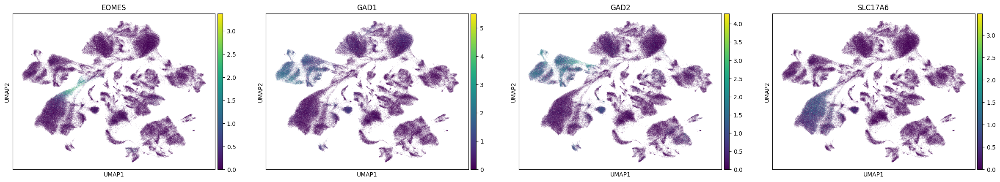

In [72]:
sc.pl.umap(adata,color=["EOMES", "GAD1", "GAD2", "SLC17A6"])

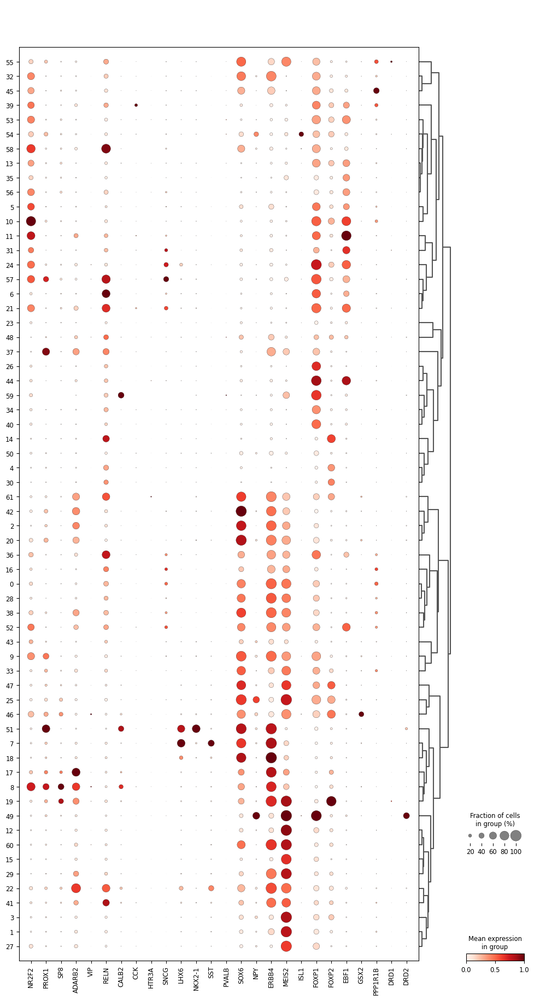

In [85]:
markers_cge = ["NR2F2", "PROX1", "SP8", "ADARB2", "VIP", "RELN", "CALB2", "CCK", "HTR3A", "SNCG"]
markers_mge = ["LHX6", "NKX2-1", "SST", "PVALB", "SOX6", "NPY", "ERBB4"]
markers_lge = ["MEIS2", "ISL1", "FOXP1", "FOXP2", "EBF1", "GSX2", "PPP1R1B", "DRD1", "DRD2"]
all_markers = markers_cge + markers_mge + markers_lge
sc.pl.dotplot(
    adata,
    var_names=all_markers,
    groupby="leiden",  # or your preferred cluster column
    dendrogram=True,
    standard_scale="var",
    show=True
)


In [39]:
adata.obs["cell_type"] = adata.obs["leiden"].map(
    {
        "0":  "Astrocyte",
        "1":  "EN-deep_layer",
        "2":  "OPC",
        "3":  "IPC",
        "4":  "Microglia",
        "5":  "Epithelial-chplx",
        "6":  "Endothelial",
        "7":  "IN-MGE-SST",
        "8":  "IN-CGE-VIP",
        "9":  "Astrocyte",
        "10": "Fibroblast-chplx",
        "11": "Pericyte",
        "12": "EN-deep_layer",
        "13": "Fibroblast-eye",
        "14": "Microglia",
        "15": "EN-upper_layer",
        "16": "Astrocyte",
        "17": "IN-CGE",
        "18": "IN-MGE",
        "19": "IN-LGE-FOXP2",
        "20": "OPC-proliferating",
        "21": "Endothelial",
        "22": "Cajal-Retzius cell",
        "23": "Mesenchymal-eye",
        "24": "Endothelial-chplx",
        "25": "RG",
        "26": "T/NK cell",
        "27": "EN-deep_layer",
        "28": "Astrocyte",
        "29": "EN-upper_layer",
        "30": "Microglia",
        "31": "SMC",
        "32": "Ependymal-chplx",
        "33": "RG",
        "34": "Macrophage",
        "35": "Fibroblast-eye",
        "36": "Endothelial",
        "37": "Oligodendrocyte",
        "38": "OPC",
        "39": "Fibroblast-meningeal",
        "40": "Macrophage",
        "41": "Cajal-Retzius cell",
        "42": "OPC",
        "43": "Glia-restricted progenitors",
        "44": "B cell",
        "45": "Ependymal-chplx",
        "46": "IN-immature",
        "47": "EN-IN-immature",
        "48": "Postnatal Neuronal cell",
        "49": "IN-LGE-FOXP1",
        "50": "Microglia",
        "51": "IN-MGE",
        "52": "Astrocyte",
        "53": "Fibroblast-eye",
        "54": "Epithelial-eye",
        "55": "Ependymal",
        "56": "Keratocyte-eye",
        "57": "Endothelial",
        "58": "Fibroblast-eye",
        "59": "Immune",
        "60": "EN-deep_layer",
        "61": "OPC"
    }
)


### Correctly subcluster EN-IN-immature cells

/home/users/isakova/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_702/2696567830.py:13: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(sub_adata, resolution=.2)  # Try 0.5–2.0 for more/fewer clusters


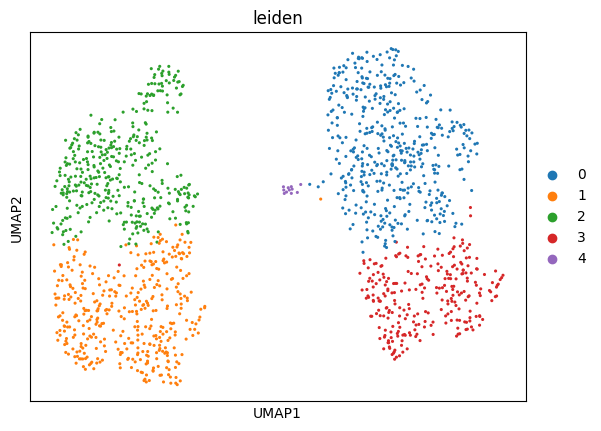

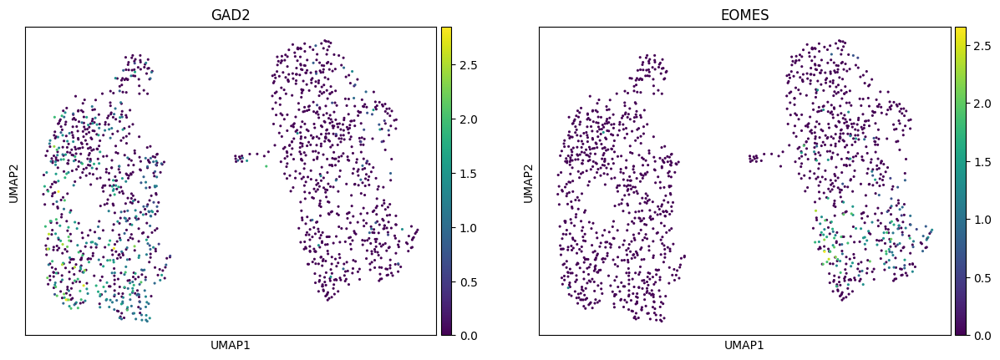

In [40]:
# Select only cells from leiden cluster 47
sub_adata = adata[adata.obs['leiden'] == '47'].copy()
import scanpy as sc

# PCA
sc.tl.pca(sub_adata, svd_solver='arpack')

# Neighbors and UMAP
sc.pp.neighbors(sub_adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(sub_adata)

# Re-cluster (Leiden)
sc.tl.leiden(sub_adata, resolution=.2)  # Try 0.5–2.0 for more/fewer clusters

# Plot
sc.pl.umap(sub_adata, color=["leiden"], size=20)
sc.pl.umap(sub_adata, color=["GAD2", "EOMES"], size=20)


In [44]:
# Map subcluster to your annotation
subcluster_annotation = {
    "0": "EN-immature",
    "1": "IN-immature",
    "2": "IN-immature",
    "3": "EN-immature",
    "4": "EN-immature"
}
# Add new annotation column in the sub_adata object
sub_adata.obs["leiden47_annotation"] = sub_adata.obs["leiden"].map(subcluster_annotation)


adata.obs['cell_type'] = adata.obs['cell_type'].astype(str)
adata.obs.loc[sub_adata.obs_names, 'cell_type'] = sub_adata.obs['leiden47_annotation'].values


#### Correct CR cells


In [46]:
mask_cr = adata.obs['cell_type'] == "Cajal-Retzius cell"
mask_prev_en = adata.obs['cell_type_lvl1'] == "EN"
# Cells to reassign: those currently CR, but previously EN
mask_reassign = mask_cr & mask_prev_en
adata.obs.loc[mask_reassign, "cell_type"] = "EN-deep_layer"

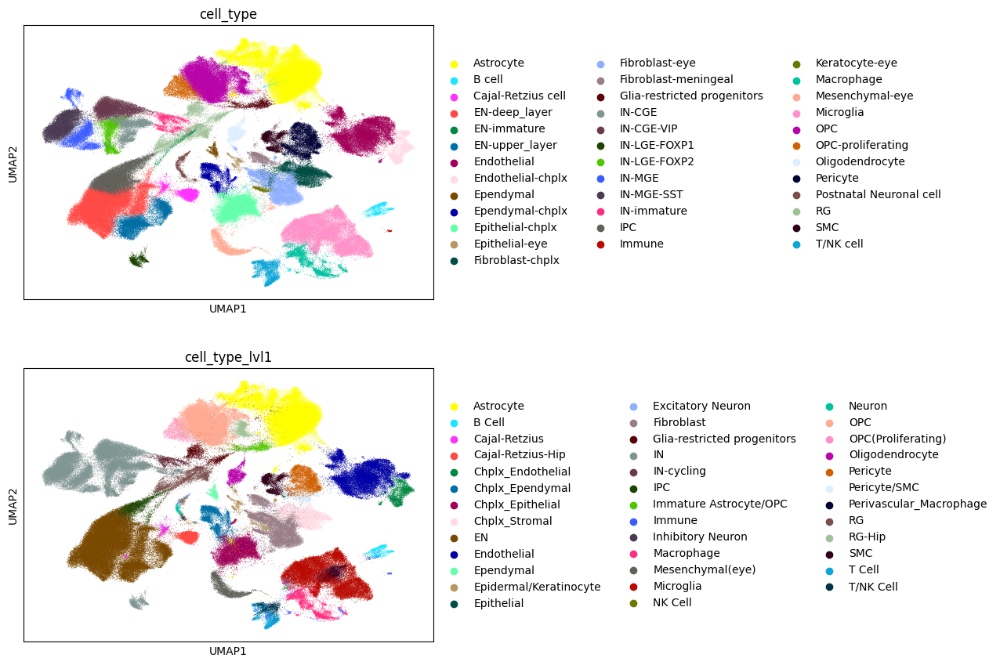

In [47]:
sc.pl.umap(adata, color=["cell_type", "cell_type_lvl1"], size=1,ncols=1)

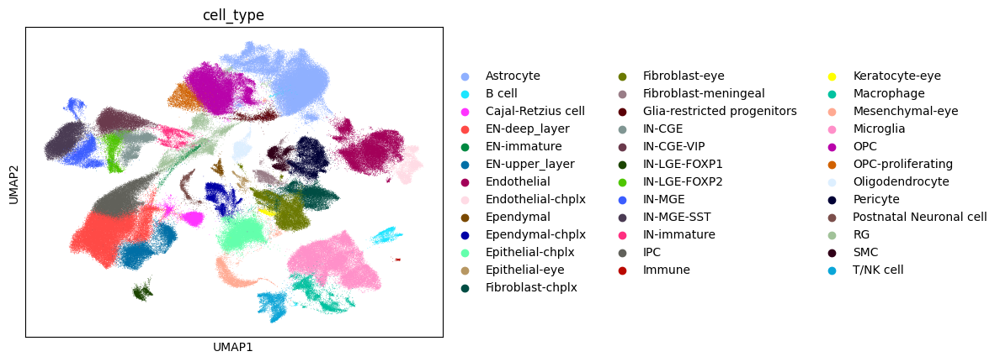

In [50]:
cell_type_to_color = {
"Astrocyte": "#8fb0ff",
"B cell": "#1ce6ff",
"Cajal-Retzius cell": "#ff34ff",
"EN-deep_layer": "#ff4a46",
"EN-immature": "#008941",
"EN-upper_layer": "#006fa6",
"Endothelial": "#a30059",
"Endothelial-chplx": "#ffdbe5",
"Ependymal": "#7a4900",
"Ependymal-chplx": "#0000a6",
"Epithelial-chplx": "#63ffac",
"Epithelial-eye": "#b79762",
"Fibroblast-chplx": "#004d43",
"Fibroblast-eye": "#6b7900",
"Fibroblast-meningeal": "#997d87",
"Glia-restricted progenitors": "#5a0007",
"IN-CGE": "#809693",
"IN-CGE-VIP": "#6a3a4c",
"IN-LGE-FOXP1": "#1b4400",
"IN-LGE-FOXP2": "#4fc601",
"IN-MGE": "#3b5dff",
"IN-MGE-SST": "#4a3b53",
"IN-immature": "#ff2f80",
"IPC": "#61615a",
"Immune": "#ba0900",
"Keratocyte-eye": "#ffff00",
"Macrophage": "#00c2a0",
"Mesenchymal-eye": "#ffaa92",
"Microglia": "#ff90c9",
"OPC": "#b903aa",
"OPC-proliferating": "#d16100",
"Oligodendrocyte": "#ddefff",
"Pericyte": "#000035",
"Postnatal Neuronal cell": "#7b4f4b",
"RG": "#a1c299",
"SMC": "#300018",
"T/NK cell": "#0aa6d8",
}
# Ensure your AnnData has cell types in same order as your mapping
cell_types = list(adata.obs['cell_type'].cat.categories)
adata.uns['cell_type_colors'] = [cell_type_to_color[ct] for ct in cell_types]
sc.pl.umap(adata, color=["cell_type"], size=1,ncols=1)

In [51]:
adata.write('TSB_annotated_log1p_scvi_full_annotated.h5ad')

In [2]:
adata = sc.read('TSB_annotated_log1p_scvi_full_annotated.h5ad')

## calculate DEGs

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:440: PerformanceWarning: DataFrame i

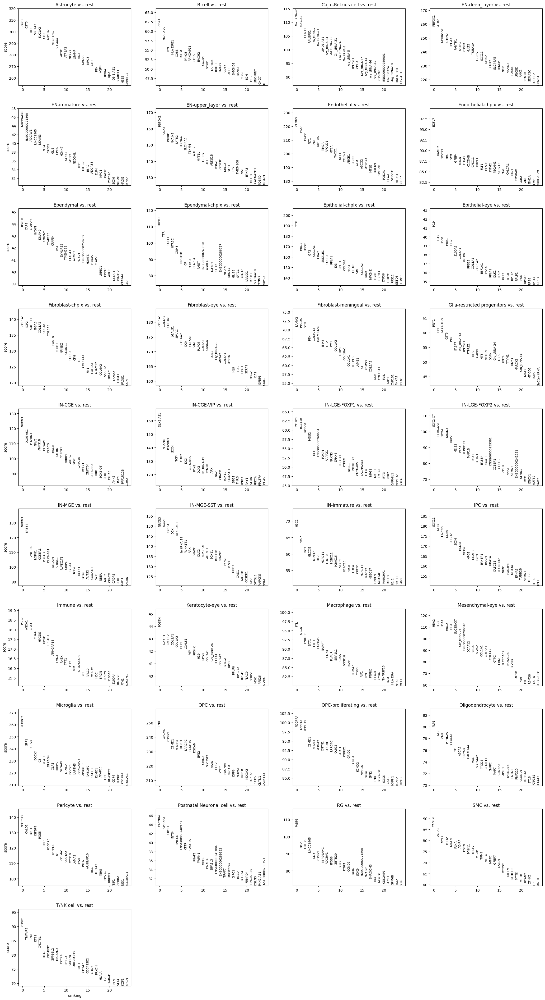

In [3]:
import pandas as pd
sc.tl.rank_genes_groups(adata, groupby="cell_type", method="wilcoxon", reference='rest')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# Save top 100 genes per cluster
result_df = sc.get.rank_genes_groups_df(adata, group=None, key='rank_genes_groups', pval_cutoff=0.01)

# Save to CSV
result_df.to_csv("TSB_rank_genes_groups_cell_type.csv", index=False)
adata.write('TSB_annotated_log1p_scvi_full_DEG.h5ad')


In [4]:
import pandas as pd
import numpy as np

# Get DE results for all clusters
de_df = sc.get.rank_genes_groups_df(adata, group=None, key='rank_genes_groups', pval_cutoff=None)

# For percentage expression, we need a binary expression matrix:
# (Here, we define "expressed" as nonzero)
X = adata.raw.X if adata.raw is not None else adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()
gene_names = adata.raw.var_names if adata.raw is not None else adata.var_names
cell_types = adata.obs['cell_type']

# Precompute boolean matrix for expression (nonzero)
expr_bool = X > 0
expr_bool_df = pd.DataFrame(expr_bool, columns=gene_names, index=adata.obs_names)

# Function to compute stats for each row of de_df
def compute_percentages(row):
    cluster = row['group']
    gene = row['names']
    # Cells in cluster
    mask_in = (cell_types == cluster).values
    mask_out = ~mask_in
    # Percentage of expressing cells
    pct_in = expr_bool_df.loc[mask_in, gene].mean() * 100
    pct_out = expr_bool_df.loc[mask_out, gene].mean() * 100
    return pd.Series({'Percentage_expressed_in_cluster': pct_in, 'Percentage_expressed_outside_cluster': pct_out})

# Apply function to each DEG row (can filter de_df for top N per cluster if desired)
stats_df = de_df.apply(compute_percentages, axis=1)
result = pd.concat([de_df, stats_df], axis=1)

# Reformat columns for clarity
result = result.rename(columns={
    'group': 'Cluster',
    'names': 'Gene',
    'logfoldchanges': 'Average_log2_fold_change',
    'pvals': 'P_value',
    'pvals_adj': 'P_value_adjusted'
})[
    ['Cluster', 'Gene', 'Average_log2_fold_change', 
     'Percentage_expressed_in_cluster', 'Percentage_expressed_outside_cluster', 
     'P_value', 'P_value_adjusted']
]

# Save to CSV
result.to_csv("TSB_DEG_summary_table.csv", index=False)


In [5]:
import pandas as pd

# Get all DEGs (no pval cutoff)
de_df = sc.get.rank_genes_groups_df(adata, group=None, key='rank_genes_groups', pval_cutoff=None)

# Rank by group and logfoldchanges (you can also rank by adjusted p-value if preferred)
top500_per_group = (
    de_df.sort_values(['group', 'logfoldchanges'], ascending=[True, False])
         .groupby('group')
         .head(500)
         .reset_index(drop=True)
)
import numpy as np

X = adata.raw.X if adata.raw is not None else adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()
gene_names = adata.raw.var_names if adata.raw is not None else adata.var_names
cell_types = adata.obs['cell_type']
expr_bool = X > 0
expr_bool_df = pd.DataFrame(expr_bool, columns=gene_names, index=adata.obs_names)

def compute_percentages(row):
    cluster = row['group']
    gene = row['names']
    mask_in = (cell_types == cluster).values
    mask_out = ~mask_in
    pct_in = expr_bool_df.loc[mask_in, gene].mean() * 100
    pct_out = expr_bool_df.loc[mask_out, gene].mean() * 100
    return pd.Series({'Percentage_expressed_in_cluster': pct_in, 'Percentage_expressed_outside_cluster': pct_out})

stats_df = top500_per_group.apply(compute_percentages, axis=1)
result = pd.concat([top500_per_group, stats_df], axis=1)
result = result.rename(columns={
    'group': 'Cluster',
    'names': 'Gene',
    'logfoldchanges': 'Average_log2_fold_change',
    'pvals': 'P_value',
    'pvals_adj': 'P_value_adjusted'
})[
    ['Cluster', 'Gene', 'Average_log2_fold_change',
     'Percentage_expressed_in_cluster', 'Percentage_expressed_outside_cluster',
     'P_value', 'P_value_adjusted']
]

result.to_csv("TSB_DEG_summary_table_top500.csv", index=False)


/tmp/ipykernel_4050/3859470163.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('group')


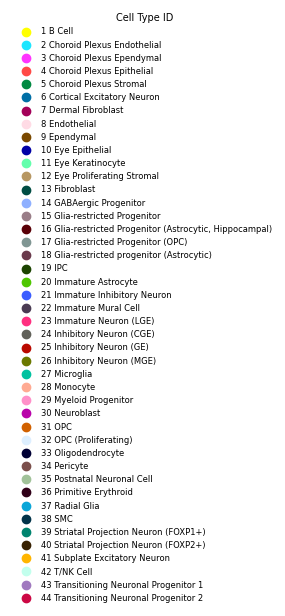

In [6]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Step 1: Create mapping from cell type to number and color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = adata.uns["cell_type_colors"]
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Step 2: Create handles for the legend (colored patch + numeric label)
# Step 2: Create circular legend handles (Line2D with marker='o')
handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='none',
        markerfacecolor=cell_type_colors[i],
        markeredgecolor=cell_type_colors[i],
        markersize=6,
        label=f"{cell_type_to_number[ct]} {ct}"  # Include number and name
    )
    for i, ct in enumerate(cell_type_categories)
]


# Step 3: Plot only the legend
fig, ax = plt.subplots(figsize=(2.5, len(handles) * 0.1))  # Adjust height for spacing

# Add legend to blank axes
legend = ax.legend(
    handles=handles,
    title="Cell Type ID",
    loc="center left",
    frameon=False,
    fontsize=6,
    title_fontsize=7
)

# Make legend font white (optional)
for text in legend.get_texts():
    text.set_color("black")
legend.get_title().set_color("black")

# Hide the axes completely
ax.axis("off")

# Save just the legend
plt.savefig("celltype_legend_only.pdf", bbox_inches="tight")  # Set black background if desired
plt.show()


/tmp/ipykernel_3591/2465601551.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


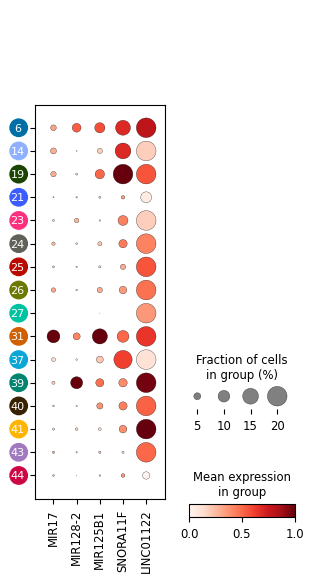

In [52]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define neuronal cell types
neuronal_types = [
    "Cortical Excitatory Neuron",
    "Subplate Excitatory Neuron",
    "Inhibitory Neuron (CGE)",
    "Inhibitory Neuron (MGE)",
    "Inhibitory Neuron (GE)",
    "Immature Inhibitory Neuron",
    "Striatal Projection Neuron (FOXP1+)",
    "Striatal Projection Neuron (FOXP2+)",
    "Transitioning Neuronal Progenitor 1",
    "Transitioning Neuronal Progenitor 2",
    "Neuroblast",
    "IPC",
    "GABAergic Progenitor",
    "Immature Neuron (LGE)",
    "Postnatal Neuronal Cell",
    "Radial Glia"
]

# Subset AnnData to only neuronal cells
neuronal_adata = adata[adata.obs["cell_type"].isin(neuronal_types), :]

# Define genes of interest
genes_of_interest = ["MIR17", "MIR128-2", "MIR125B1", "SNORA11F","LINC01122"]
genes_present = [gene for gene in genes_of_interest if gene in neuronal_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    neuronal_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.2,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Set compact figure size
#dotplot_obj.fig.set_size_inches(4, 3)

# Generate the figure
dotplot_obj.make_figure()

# Access the main plot axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove y-axis labels
ax.set_yticklabels([])

# Get y-tick positions and corresponding labels
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories

# Create cell type number mapping
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored dots and numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    # Circle
    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    # Number
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")

# Fix aspect for round circles
ax.set_aspect("equal", adjustable="box")

# Save and show
plt.tight_layout()
plt.savefig("miRNA_neuronal.pdf")
plt.show()


/tmp/ipykernel_3591/2857388326.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


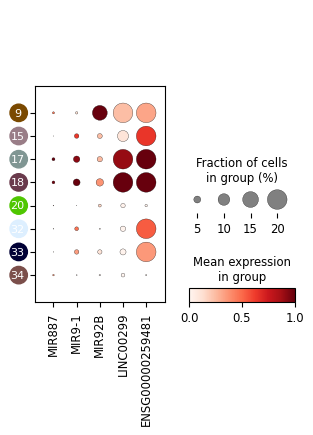

In [54]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define glial cell types
glial_types = [
    "Immature Astrocyte",
    "Ependymal",
    "Glia-restricted progenitor (Astrocytic)",
    "Glia-restricted progenitor (Astrocytic, Hippocampal)",
    "Glia-restricted Progenitor (OPC)",
    "Glia-restricted Progenitor",
    "OPC",
    "OPC (Proliferating)",
    "Oligodendrocyte"
]

# Subset AnnData to only glial cells
glial_adata = adata[adata.obs["cell_type"].isin(glial_types), :]

# Define genes of interest
genes_of_interest = ["MIR887", "MIR9-1", "MIR92B","LINC00299", "ENSG00000259481"]
genes_present = [gene for gene in genes_of_interest if gene in glial_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    glial_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.2,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Draw the plot
dotplot_obj.make_figure()
#dotplot_obj.fig.set_size_inches(3, 3)
# Access the main plot axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove the text labels on the y-axis
ax.set_yticklabels([])

# Get y-tick positions and corresponding labels
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories  # This matches the y-axis order

# Map cell type to number
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored dots with numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    # Colored circle
    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    ax.set_aspect('equal', adjustable='datalim')
    # Numeric label
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")

# Save and show
plt.tight_layout()
plt.savefig("miRNA_glial.pdf")
plt.show()


/tmp/ipykernel_3591/2318453336.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


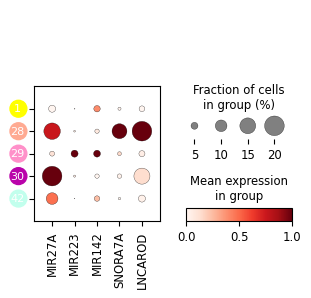

In [55]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define immune cell types
immune_types = [
    "Microglia",
    "T/NK Cell",
    "B Cell",
    "Monocyte",
    "Myeloid Progenitor"
]

# Subset AnnData to only immune cells
immune_adata = adata[adata.obs["cell_type"].isin(immune_types), :]

# Define genes of interest (adjust if needed)
genes_of_interest = ["MIR27A", "MIR223", "MIR142", "SNORA7A","LNCAROD"]
genes_present = [gene for gene in genes_of_interest if gene in immune_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    immune_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.2,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Optionally set a compact size
#dotplot_obj.fig.set_size_inches(4, 3)

# Generate the figure
dotplot_obj.make_figure()

# Access the main axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove y-axis labels
ax.set_yticklabels([])

# Get tick positions and immune cell types used in the plot
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories

# Map all cell types to numbers
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored circles and numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    # Draw colored dot
    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    # Add numeric label
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")

# Fix aspect for round dots
ax.set_aspect("equal", adjustable="box")

# Save and show
plt.tight_layout()
plt.savefig("miRNA_immune.pdf")
plt.show()


/tmp/ipykernel_3591/1419365080.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


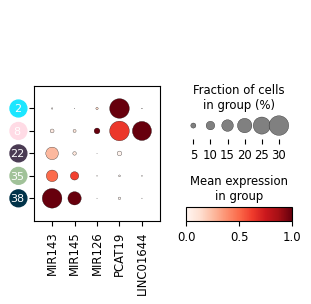

In [56]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define vascular cell types
vascular_types = [
    "Endothelial",
    "Choroid Plexus Endothelial",
    "Pericyte",
    "Immature Mural Cell",
    "SMC"
]

# Subset AnnData to only vascular cells
vascular_adata = adata[adata.obs["cell_type"].isin(vascular_types), :]

# Define genes of interest
genes_of_interest = ["MIR143", "MIR145", "MIR126",  "PCAT19", "LINC01644"]
genes_present = [gene for gene in genes_of_interest if gene in vascular_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    vascular_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.3,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Set compact figure size
#dotplot_obj.fig.set_size_inches(4, 2.5)

# Draw the figure
dotplot_obj.make_figure()

# Access the main axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove y-axis labels
ax.set_yticklabels([])

# Get tick positions and cell types
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories

# Map cell types to numbers
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored circles and numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")

# Set aspect for round circles
ax.set_aspect("equal", adjustable="box")

# Save and show
plt.tight_layout()
plt.savefig("miRNA_vascular.pdf")
plt.show()


/tmp/ipykernel_3591/4235714062.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


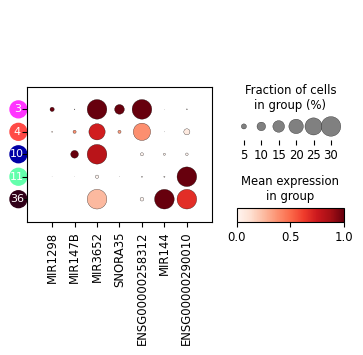

In [57]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define epithelial cell types
epithelial_types = [
    "Choroid Plexus Epithelial",
    "Choroid Plexus Ependymal",
    "Eye Keratinocyte",
    "Eye Epithelial",
    "Primitive Erythroid"
]

# Subset AnnData to only epithelial cells
epithelial_adata = adata[adata.obs["cell_type"].isin(epithelial_types), :]

# Define genes of interest
genes_of_interest = ["MIR1298", "MIR147B", "MIR3652","SNORA35",  "ENSG00000258312","MIR144", "ENSG00000290010"]

# Filter to genes that exist in the dataset
genes_present = [gene for gene in genes_of_interest if gene in epithelial_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    epithelial_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.3,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Draw the plot
dotplot_obj.make_figure()
#dotplot_obj.fig.set_size_inches(3, 3)
# Access the main plot axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove the text labels on the y-axis
ax.set_yticklabels([])

# Get y-tick positions and corresponding labels
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories  # This matches the y-axis order

# Map cell type to number
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored dots with numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    # Colored circle
    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    ax.set_aspect('equal', adjustable='datalim')
    # Numeric label
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")


# Save and show
plt.tight_layout()
plt.savefig("miRNA_epi_ery.pdf", bbox_inches="tight")
plt.show()


/tmp/ipykernel_3591/3340562500.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


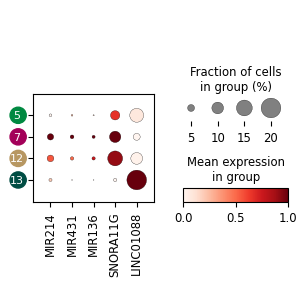

In [58]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Define mesenchymal/stromal cell types
mesenchymal_types = [
    "Fibroblast", "Dermal Fibroblast",  "Choroid Plexus Stromal", "Eye Proliferating Stromal"
]

# Subset AnnData to only mesenchymal cells
mesenchymal_adata = adata[adata.obs["cell_type"].isin(mesenchymal_types), :]

# Define genes of interest (adjust if needed)
genes_of_interest = ["MIR214", "MIR431", "MIR136","SNORA11G","LINC01088", ]
genes_present = [gene for gene in genes_of_interest if gene in mesenchymal_adata.var_names]

# Get mapping of cell type to color
cell_type_categories = adata.obs["cell_type"].cat.categories
cell_type_colors = dict(zip(cell_type_categories, adata.uns["cell_type_colors"]))

# Create dotplot
dotplot_obj = sc.pl.dotplot(
    mesenchymal_adata,
    var_names=genes_present,
    groupby="cell_type",
    standard_scale="var",
    dot_max=0.2,
    cmap="Reds",
    dendrogram=False,
    return_fig=True,
    show=False
)

# Optional: set figure size
#dotplot_obj.fig.set_size_inches(4, 2.5)

# Draw the plot
dotplot_obj.make_figure()

# Access the main axis
ax = dotplot_obj.ax_dict["mainplot_ax"]

# Remove y-axis labels
ax.set_yticklabels([])

# Get y-tick positions and the plotted mesenchymal cell types
yticks = ax.get_yticks()
cell_types = dotplot_obj.categories

# Map all cell types to numbers
cell_type_to_number = {ct: str(i) for i, ct in enumerate(cell_type_categories, 1)}

# Draw colored dots and numeric labels
for ytick, cell_type in zip(yticks, cell_types):
    color = cell_type_colors.get(cell_type, "gray")
    number = cell_type_to_number.get(cell_type, "?")

    # Draw colored circle
    ax.add_patch(mpatches.Circle((-1, ytick), radius=0.375, color=color,
                                 transform=ax.transData, clip_on=False))
    # Draw numeric label
    ax.text(-1.05, ytick, number, va='center', ha='center', fontsize=8, color="white")

# Fix aspect ratio for round circles
ax.set_aspect("equal", adjustable="box")

# Save and display
plt.tight_layout()
plt.savefig("miRNA_mesenchymal.pdf")
plt.show()


### Plot Cell type specific DEGs

In [59]:
import pandas as pd

# Load the previously saved DEGs from CSV
deg_df = pd.read_csv("TSB_rank_genes_groups_cell_type.csv")

# Ensure 'names' column matches index in adata.var (i.e., gene identifiers)
deg_df["biotype"] = deg_df["names"].map(adata.var["biotype"])


In [60]:
deg_df = deg_df[(deg_df['logfoldchanges'] >= 1) & (deg_df['pvals_adj'] <= 0.01)]
deg_df["biotype"] = deg_df["biotype"].str.strip()

# Define the biotypes of interest
biotypes_to_keep = ["miRNA", "snoRNA", "snRNA", "tRNA", "scaRNA", "histone_RNA", "lncRNA"]

# Filter the DataFrame
deg_df = deg_df[deg_df["biotype"].isin(biotypes_to_keep)]

# Count number of DEGs per (group, biotype) pair
deg_counts = (
    deg_df.groupby(["group", "biotype"])
    .size()
    .reset_index(name="n_DEGs")
)
deg_counts

,group,biotype,n_DEGs
0,B Cell,histone_RNA,1
1,B Cell,lncRNA,192
2,B Cell,miRNA,5
3,B Cell,snRNA,12
4,B Cell,snoRNA,4
...,...,...,...
228,Transitioning Neuronal Progenitor 2,histone_RNA,54
229,Transitioning Neuronal Progenitor 2,lncRNA,16
230,Transitioning Neuronal Progenitor 2,miRNA,1
231,Transitioning Neuronal Progenitor 2,snRNA,3


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot to wide format
pivot_df = deg_counts.pivot(index="group", columns="biotype", values="n_DEGs").fillna(0)

# Sort groups by total DEGs (optional)
pivot_df = pivot_df.loc[pivot_df.sum(axis=1).index]

# Plot
pivot_df.plot(kind="bar", stacked=True, figsize=(13, 7), colormap="tab10")
plt.ylabel("Number of DEGs")
plt.xlabel("Cell Type")
plt.title("Number of DEGs per Biotype per Cell Type")
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.savefig("DEG_number_per_cell_type.pdf", bbox_inches="tight")
plt.show()


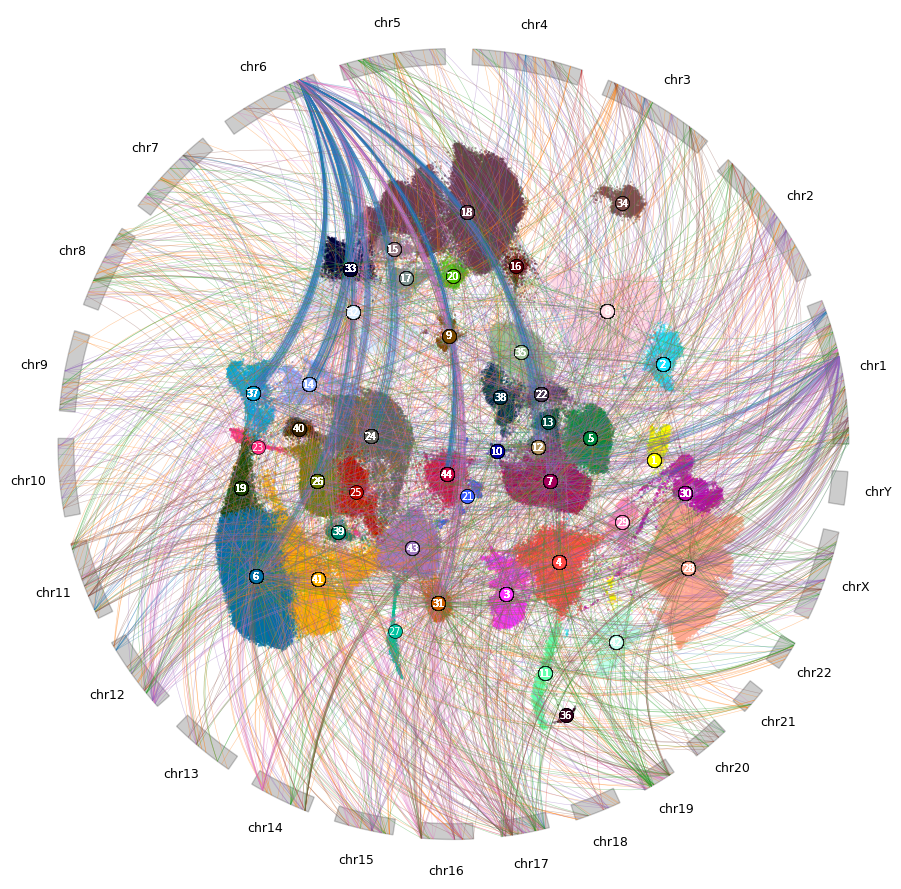

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import PathPatch
from matplotlib.path import Path
import scanpy as sc


deg_df_top2000 = (
    deg_df
    .sort_values(by="pvals_adj")  # or use 'scores' to sort by effect size
    .groupby("biotype")
    .head(400)
    .copy()
)

# --- 1. Setup gene list ---
genes_of_interest = [
    'MIR137', 'SLC2A1', 'SLC2A1-DT', 'SLC2A12', 'SLC2A14', 'SLC2A13',
    'MIR17HG', 'TGM2', 'SLC2A10', 'SLC2A11', 'MIR16-2', 'MIR16-1',
    'MIR17', 'MIR92A1', 'MIR629', 'MIR92A2'
]
genes_found = adata.var_names.intersection(genes_of_interest)

# --- 2. Compute UMAP centroids of high-expressing cells ---
records = []
for gene in genes_found:
    expr = adata[:, gene].X
    expr = expr.toarray().flatten() if hasattr(expr, "toarray") else expr.flatten()
    if (expr > 0).sum() < 3:
        continue
    threshold = np.percentile(expr, 90)
    high_expr_cells = expr > threshold
    umap_coords = adata.obsm['X_umap'][high_expr_cells]
    umap_center = umap_coords.mean(axis=0)
    chrom = str(adata.var.loc[gene, 'chromosome'])
    start = adata.var.loc[gene, 'start']
    records.append({
        'gene': gene,
        'chromosome': chrom,
        'position': start,
        'umap_x': umap_center[0],
        'umap_y': umap_center[1]
    })
df = pd.DataFrame(records)
df['biotype'] = df['gene'].map(adata.var['biotype'].to_dict())

# --- 3. Setup chromosome layout with gaps ---
chromosomes = [f"chr{i}" for i in range(1, 23)] + ['chrX', 'chrY']
num_chromosomes = len(chromosomes)
chrom_lengths = {
    'chr1': 248_956_422, 'chr2': 242_193_529, 'chr3': 198_295_559, 'chr4': 190_214_555,
    'chr5': 181_538_259, 'chr6': 170_805_979, 'chr7': 159_345_973, 'chr8': 145_138_636,
    'chr9': 138_394_717, 'chr10': 133_797_422, 'chr11': 135_086_622, 'chr12': 133_275_309,
    'chr13': 114_364_328, 'chr14': 107_043_718, 'chr15': 101_991_189, 'chr16': 90_338_345,
    'chr17': 83_257_441, 'chr18': 80_373_285, 'chr19': 58_617_616, 'chr20': 64_444_167,
    'chr21': 46_709_983, 'chr22': 50_818_468, 'chrX': 156_040_895, 'chrY': 57_227_415
}



total_length = sum(chrom_lengths.values())
gap_angle = np.deg2rad(4)
total_gap = gap_angle * len(chromosomes)
usable_angle = 2 * np.pi - total_gap

# Compute individual arc angles
angle_per_bp = usable_angle / total_length
chrom_arc_angles = {chrom: chrom_lengths[chrom] * angle_per_bp for chrom in chromosomes}

# Compute cumulative start angles
angle_offsets = {}
current_angle = 0
for chrom in chromosomes:
    angle_offsets[chrom] = current_angle
    current_angle += chrom_arc_angles[chrom] + gap_angle


def compute_angle(chrom, pos):
    if chrom not in angle_offsets or chrom not in chrom_arc_angles:
        return np.nan
    return angle_offsets[chrom] + (pos / chrom_lengths[chrom]) * chrom_arc_angles[chrom]


df['chromosome'] = df['chromosome'].astype(str)
df['angle'] = df.apply(lambda row: compute_angle(row['chromosome'], row['position']), axis=1)

# --- 4. Normalize UMAP and project inside circle ---
df['umap_x_norm'] = (df['umap_x'] - df['umap_x'].mean()) / df['umap_x'].std()
df['umap_y_norm'] = (df['umap_y'] - df['umap_y'].mean()) / df['umap_y'].std()
radius = 5
circle_center_x = df['umap_x_norm'].max() + radius + 2
circle_center_y = df['umap_y_norm'].mean()
umap_center = df[['umap_x_norm', 'umap_y_norm']].values.mean(axis=0)
vecs = df[['umap_x_norm', 'umap_y_norm']].values - umap_center
scale_factor = (radius * 0.8) / np.linalg.norm(vecs, axis=1).max()
scaled_vecs = vecs * scale_factor
df['circle_x'] = circle_center_x + scaled_vecs[:, 0]
df['circle_y'] = circle_center_y + scaled_vecs[:, 1]


# Normalize entire UMAP for consistent positioning
umap_all = adata.obsm['X_umap']
umap_all_norm = (umap_all - umap_all.mean(axis=0)) / umap_all.std(axis=0)

# Scale to fit inside the genomic circle
umap_center_all = umap_all_norm.mean(axis=0)
vecs_all = umap_all_norm - umap_center_all
scale_factor_all = (radius * 0.8) / np.linalg.norm(vecs_all, axis=1).max()
scaled_vecs_all = vecs_all * scale_factor_all

# Project to circular space
umap_x_inside = circle_center_x + scaled_vecs_all[:, 0]
umap_y_inside = circle_center_y + scaled_vecs_all[:, 1]

# Map cell_class to colors
cell_classes = adata.obs['cell_type'].unique()
#cmap = plt.get_cmap('tab10') if len(cell_classes) <= 10 else plt.get_cmap('tab40')
#class_colors = {cls: cmap(i % cmap.N) for i, cls in enumerate(cell_classes)}

# Ensure 'cell_type_lvl1' is categorical
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")

# Extract Scanpy's color order
scanpy_colors = adata.uns["cell_type_colors"]
scanpy_categories = adata.obs["cell_type"].cat.categories

# Create a mapping of cell type → color
class_colors = dict(zip(scanpy_categories, scanpy_colors))

# Map to each cell
cell_class_flat = adata.obs["cell_type"].astype(str)
colors = cell_class_flat.map(class_colors)


# --- 5. Plot setup ---
fig, ax = plt.subplots(figsize=(12, 9))
# Plot all cells with their class color
ax.scatter(umap_x_inside, umap_y_inside, s=0.2, c=colors, alpha=0.6, label='Cells by type')

# Cell type legend
#celltype_legend = [Line2D([0], [0], marker='o', color='w', label=cls,
#                          markerfacecolor=class_colors[cls], markersize=6)
#                   for cls in cell_classes]
#legend1 = ax.legend(handles=celltype_legend, title='Cell Type', loc='lower left', bbox_to_anchor=(0.01, 0.01))
#ax.add_artist(legend1)  # Keep it when adding second legend


#ax.scatter(umap_x_inside, umap_y_inside, s=4, color='lightgray', alpha=0.5, label='All cells')
#ax.scatter(df['circle_x'], df['circle_y'], s=80, color='dodgerblue', label='UMAP gene centers')

# --- 6. Draw disconnected genome arcs ---
arc_thickness = 0.2
for chrom in chromosomes:
    theta_start = angle_offsets[chrom]
    theta_end = theta_start + chrom_arc_angles[chrom]
    arc = np.linspace(theta_start, theta_end, 100)
    # then same as before to draw thick arc using outer and inner radius
    outer_r = radius
    inner_r = radius - arc_thickness
    x_outer = circle_center_x + outer_r * np.cos(arc)
    y_outer = circle_center_y + outer_r * np.sin(arc)
    x_inner = circle_center_x + inner_r * np.cos(arc[::-1])
    y_inner = circle_center_y + inner_r * np.sin(arc[::-1])
    x_arc = np.concatenate([x_outer, x_inner])
    y_arc = np.concatenate([y_outer, y_inner])
    ax.fill(x_arc, y_arc, color='black', alpha=0.2, edgecolor='black')
    mid_theta = (theta_start + theta_end) / 2
    ax.text(circle_center_x + (outer_r + 0.4) * np.cos(mid_theta),
            circle_center_y + (outer_r + 0.4) * np.sin(mid_theta),
            chrom, ha='center', va='center', fontsize=9)


from matplotlib.lines import Line2D

# Subset to only DEGs with valid biotype and found in adata
deg_genes = deg_df_top2000[deg_df_top2000["names"].isin(adata.var_names) & deg_df_top2000["biotype"].notna()].copy()
deg_genes["angle"] = deg_genes.apply(
    lambda row: compute_angle(str(adata.var.loc[row["names"], "chromosome"]),
                              adata.var.loc[row["names"], "start"])
    if row["names"] in adata.var_names else np.nan,
    axis=1
)

# Compute UMAP centroids for each gene's expressing cell class (from 'group')
cell_type_to_number = {ct: str(i) for i, ct in enumerate(scanpy_categories, 1)}

deg_centroids = []
for _, row in deg_genes.iterrows():
    gene = row["names"]
    group = row["group"]
    if gene not in adata.var_names:
        continue
    cells_in_group = adata.obs["cell_type"] == group
    if cells_in_group.sum() < 3:
        continue
    umap_coords = adata.obsm["X_umap"][cells_in_group]
    umap_center = umap_coords.mean(axis=0)
    deg_centroids.append({
        "gene": gene,
        "group": group,
        "umap_x": umap_center[0],
        "umap_y": umap_center[1],
        "biotype": row["biotype"],
        "angle": row["angle"]
    })

df_deg_lines = pd.DataFrame(deg_centroids)
# --- Color curved connectors by biotype ---
biotypes = df_deg_lines['biotype'].dropna().unique()
cmap = plt.get_cmap('tab10') if len(biotypes) <= 10 else plt.get_cmap('tab20')
color_map = {bt: cmap(i % cmap.N) for i, bt in enumerate(sorted(biotypes))}


# Normalize UMAP coordinates
df_deg_lines["umap_x_norm"] = (df_deg_lines["umap_x"] - umap_all[:,0].mean()) / umap_all[:,0].std()
df_deg_lines["umap_y_norm"] = (df_deg_lines["umap_y"] - umap_all[:,1].mean()) / umap_all[:,1].std()

# Project to circular space
vecs = df_deg_lines[["umap_x_norm", "umap_y_norm"]].values - umap_center_all
scaled_vecs = vecs * scale_factor_all
df_deg_lines["circle_x"] = circle_center_x + scaled_vecs[:, 0]
df_deg_lines["circle_y"] = circle_center_y + scaled_vecs[:, 1]

# Plot centroid dots for each DEG, colored by associated cell type
for _, row in df_deg_lines.iterrows():
    if pd.isna(row['circle_x']) or pd.isna(row['group']):
        continue
    color = class_colors.get(row['group'], 'gray')
    # Plot colored circle
    ax.scatter(row['circle_x'], row['circle_y'], color=color, s=100, edgecolor='black', linewidth=0.5, zorder=10)

    # Plot number inside
    cell_number = cell_type_to_number.get(row['group'], "?")
    ax.text(row['circle_x'], row['circle_y'], cell_number, ha='center', va='center',
        fontsize=7, color='white', zorder=11)

# Draw connections for DEGs
for _, row in df_deg_lines.iterrows():
    if pd.isna(row['angle']):
        continue
    jitter = np.random.normal(scale=0.05, size=2)
    start = (row['circle_x'] + jitter[0], row['circle_y'] + jitter[1])

    #start = (row['circle_x'], row['circle_y'])
    end = (
        circle_center_x + radius * np.cos(row['angle']),
        circle_center_y + radius * np.sin(row['angle'])
    )
    ctrl_x = (start[0] + end[0]) / 2 + 0.3 * (end[1] - start[1])
    ctrl_y = (start[1] + end[1]) / 2 - 0.3 * (end[0] - start[0])
    path = Path([start, (ctrl_x, ctrl_y), end], [Path.MOVETO, Path.CURVE3, Path.CURVE3])
    patch = PathPatch(path, edgecolor=color_map.get(row['biotype'], 'gray'),
                      lw=.4, alpha=0.4, facecolor='none')
    ax.add_patch(patch)
    #ax.text(end[0], end[1], row['gene'], fontsize=7, ha='center', va='center',
    #        color=color_map.get(row['biotype'], 'gray'))


# --- 8. Final touches ---
ax.set_aspect('equal')
ax.axis('off')
#biotype_legend = [Line2D([0], [0], color=color_map[bt], lw=2, label=bt) for bt in biotypes]
#ax.legend(handles=biotype_legend, title='Gene Biotype', loc='upper left', bbox_to_anchor=(1.02, 1))

#plt.title('UMAP inside Detached Genomic Arcs by Biotype')
plt.tight_layout()
plt.savefig("circle_of_RNA_v2.png", dpi=300, bbox_inches="tight")

plt.show()


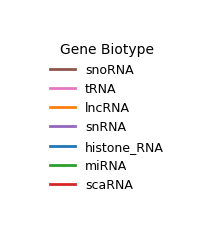

In [63]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# Create legend handles (reusing your existing code)
biotype_legend = [Line2D([0], [0], color=color_map[bt], lw=2, label=bt) for bt in biotypes]

# Create a new figure just for the legend
fig, ax = plt.subplots(figsize=(2.5, len(biotype_legend) * 0.4))  # Adjust size as needed
legend = ax.legend(
    handles=biotype_legend,
    title='Gene Biotype',
    loc='center',
    frameon=False,
    fontsize=9,
    title_fontsize=10
)

# Remove axes
ax.axis('off')

# Save just the legend figure
plt.savefig("gene_biotype_legend_only.pdf", bbox_inches='tight')
plt.show()

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_utils.py:1352: FutureWarning: `scale` is deprecated, use `density_norm` instead
  warnings.warn(msg, FutureWarning)


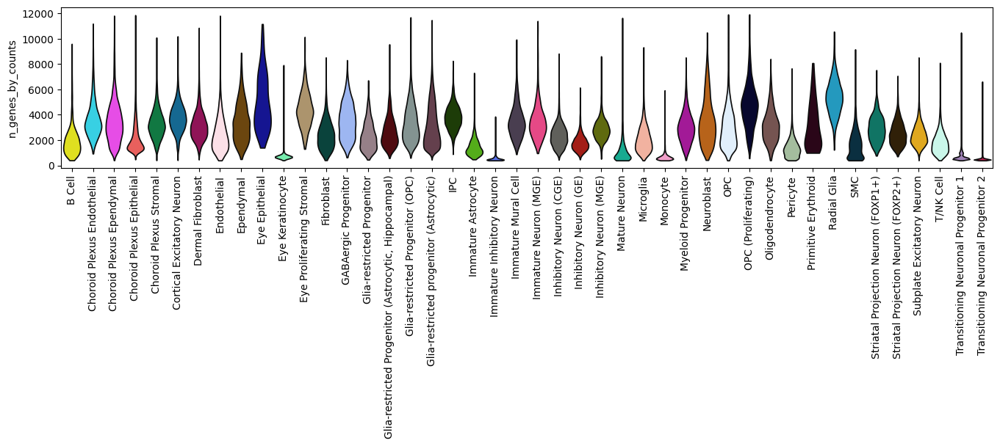

In [81]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (13, 3) 
sc.pl.violin(
    adata,
    keys='n_genes_by_counts',
    groupby='cell_type',
    rotation=90,
    stripplot=False,
    jitter=0.0,
    size=1,
    scale='width',
    save="_gene_by_cell_type.pdf"  # Saves to ./violin_gene_by_cell_type.png
)

/tmp/ipykernel_3591/708610004.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_counts = df.groupby(['cell_type', 'age']).size().reset_index(name='count')


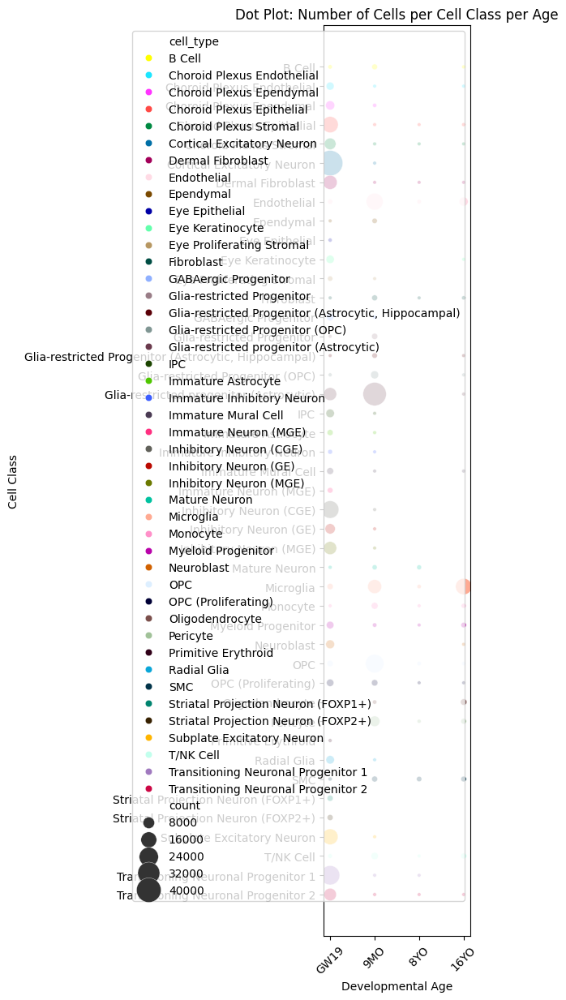

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Prepare data
df = adata.obs[['cell_type', 'age']].copy()

# Step 2: Count number of cells per combination
cell_counts = df.groupby(['cell_type', 'age']).size().reset_index(name='count')

# Step 3: Remove zero-count rows explicitly (in case they exist)
cell_counts = cell_counts[cell_counts['count'] > 0]
# Optional: Define chronological order
age_order = ['GW19', '9MO', '8YO', '16YO']
cell_counts['age'] = pd.Categorical(cell_counts['age'], categories=age_order, ordered=True)

# Step 3: Remove combinations with zero cells (though groupby naturally skips them)
# Optional if you used .size() without unstack/fillna – you likely don't have zeros
# Step 2: Count number of cells
# Ensure 'cell_type_lvl1' is categorical
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")

# Extract Scanpy's color order
scanpy_colors = adata.uns["cell_type_colors"]
scanpy_categories = adata.obs["cell_type"].cat.categories

# Create a mapping of cell type → color
class_colors = dict(zip(scanpy_categories, scanpy_colors))

# Map to each cell
cell_class_flat = adata.obs["cell_type"].astype(str)
colors = cell_class_flat.map(class_colors)

# Step 4: Plot
plt.figure(figsize=(6, 13))
sns.scatterplot(
    data=cell_counts,
    x='age',
    y='cell_type',
    size='count',
    hue="cell_type",        # <-- color by cell class
    sizes=(10, 500),         # Adjust dot size range
    palette=class_colors,         # or your custom palette
    legend=True
)

plt.title('Dot Plot: Number of Cells per Cell Class per Age')
plt.xlabel('Developmental Age')
plt.ylabel('Cell Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("cell_type_by_age2.pdf", format="pdf", bbox_inches="tight")

plt.show()